In [8]:
import scipy
import sqlite3
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import json
import altair as alt
import scipy.stats as stats
alt.data_transformers.disable_max_rows()
alt.themes.enable("dark")

ThemeRegistry.enable('dark')

In [2]:
database = "crypto_historical_data.db"

In [19]:
def load_crypto_data():
    with sqlite3.connect(database) as conn:
        df = pd.read_sql("SELECT time_close, close, high, low FROM btc_price", conn)
    df["time_close"] = pd.to_datetime(df["time_close"])
    return df

df = load_crypto_data()

In [34]:
fitcut = (60, 10*365)

def fit_func(x, p1, p2, p3):
    return p1+p2*np.log(x)+p3*np.log(x)**2

cutdata = df.iloc[fitcut[0]:fitcut[1]]
plotcutdata = df.iloc[fitcut[0]:]
xdata = np.array([x+1 for x in cutdata.index.values])
ydata = np.log(cutdata["close"])

popt, pcov = scipy.optimize.curve_fit(fit_func, xdata, ydata)
polyfit_1d = fit_func(plotcutdata.index.values+1, *popt)

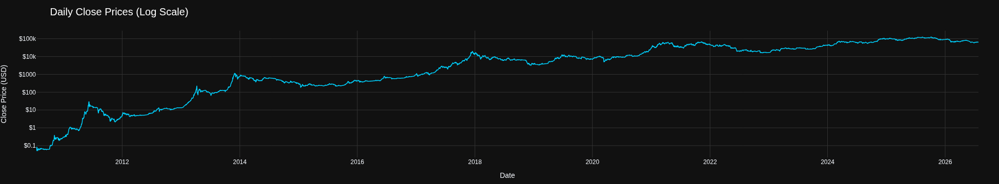

In [35]:
def generate_plot_log_regression(df):
    fig = go.Figure()

    fig.add_trace(
        go.Scatter(
            x=df["time_close"].tolist(),
            y=df["close"].astype(float).tolist(),
            mode="lines",
            line=dict(color="#00d2ff", width=1.5),
            name="Close Price",
            hovertemplate="<b>Date:</b> %{x|%Y-%m-%d}<br><b>Price:</b> $%{y:,.2f}<extra></extra>",
        )
    )
    
    # --- Layout & Axis Setup ---
    fig.update_layout(
        template="plotly_dark",
        height=1000,
        title=dict(
            text="Daily Close Prices (Log Scale)", font=dict(size=20, color="white")
        ),
        xaxis=dict(
            title="Date",
            type="date",
            showgrid=True,
            gridcolor="#333333",
        ),
        yaxis=dict(
            title="Close Price (USD)",
            type="log",  # Sets the Y-axis scale to logarithmic
            dtick=1,  # Ticks at every power of 10 ($1, $10, $100, $10k, etc.)
            tickprefix="$",
            showgrid=True,
            gridcolor="#333333",
        ),
        hovermode="x unified",
        margin=dict(l=40, r=40, t=60, b=40),
    )
    return fig

generate_plot_log_regression(df)

True

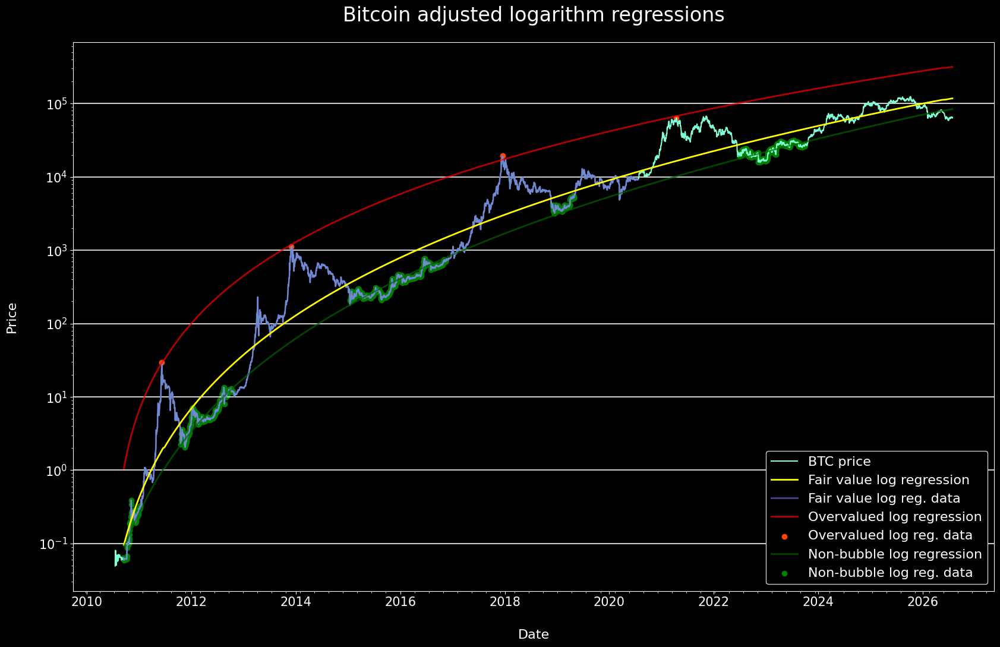

In [54]:
def plot_adj_log_regression_btc(data_raw):
    
    data = data_raw.copy()
    
    # global tops
    
    tops = ("2011-06-08", "2013-11-30", "2017-12-16", "2021-04-14")
    
    # 1. Convert targets to python date objects
    top_dates = [pd.to_datetime(t).date() for t in tops]
    
    # 2. Extract .dt.date from your time_close column to compare
    topcutdata = df[pd.to_datetime(df["time_close"]).dt.date.isin(top_dates)]

    
    xdata = np.array([x+1 for x in topcutdata.index.values])
    ydata = np.log(topcutdata["close"])

    
    popt, pcov = scipy.optimize.curve_fit(fit_func, xdata, ydata)
    top_polyfit_1d = fit_func(plotcutdata.index.values+1, *popt)
    
    # non blubble data
    
    nonbubble = ["2010-09-10", "2011-01-10", "2011-10-19", "2012-10-16", "2015-01-15", "2016-11-14", "2018-12-01", "2019-05-01", "2022-07-01", "2023-10-01"]# "2019-05-08"]
    nonbubblepoints = []
    for i in range(len(nonbubble)//2):
        curdata = data[((data["time_close"] >= nonbubble[i*2]) & (data["time_close"] <= nonbubble[i*2+1]))]
        nonbubblepoints.append(curdata)
    nonbubblecutdata = pd.concat(nonbubblepoints)
    
    xdata = np.array([x+1 for x in nonbubblecutdata.index.values])
    ydata = np.log(nonbubblecutdata["close"])
    
    popt, pcov = scipy.optimize.curve_fit(fit_func, xdata, ydata)
    nb_polyfit_1d = fit_func(plotcutdata.index.values+1, *popt)
    
    # Setting figure up

    plt.style.use('dark_background')

    fig, ax = plt.subplots(figsize=(20, 12))
    plt.yscale("log")

    plt.xlabel("Date", fontsize = 16, labelpad = 25)
    plt.ylabel("Price", fontsize = 16, labelpad = 25)
    plt.xticks(fontsize = 15)
    plt.yticks(fontsize = 15)

    ax.get_xaxis().set_minor_locator(mpl.ticker.MultipleLocator(100))
    #     ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
    ax.grid(axis = "y", which='major', color='w', linewidth=1.5, alpha = 0.8)
    # ax.grid(axis = "y", b=True, which='minor', color='w', linewidth=0.75, linestyle = "dotted", alpha = 0.5)

    #     ax.set_ylim(top = )
    # ax.set_xlim(0, 1500)

    plt.title("Bitcoin adjusted logarithm regressions", fontsize = 24, pad = 25)
    line1,  = ax.plot(data["time_close"], data["close"], color = "aquamarine")
    
    # fair value
    line3,  = ax.plot(cutdata["time_close"], cutdata["close"], color = "slateblue", linewidth = 2, alpha = 0.7)
    line2,  = ax.plot(plotcutdata["time_close"], np.exp(polyfit_1d), color = "yellow", linewidth = 2)
    
    # tops
    line4,  = ax.plot(plotcutdata["time_close"], np.exp(top_polyfit_1d), color = "red", linewidth = 2, alpha = 0.7)
    line5  = ax.scatter(topcutdata["time_close"], topcutdata["close"], color = "orangered")
    
    #non bubble
    line6,  = ax.plot(plotcutdata["time_close"], np.exp(nb_polyfit_1d), color = "darkgreen", linewidth = 2, alpha = 0.7)
    line7  = ax.scatter(nonbubblecutdata["time_close"], nonbubblecutdata["close"], color = "green", alpha = 1)
    
    
    plt.legend(handles = [line1, line2, line3, line4, line5, line6, line7], 
               labels = ["BTC price", "Fair value log regression", "Fair value log reg. data", 
                         "Overvalued log regression", "Overvalued log reg. data", 
                         "Non-bubble log regression", "Non-bubble log reg. data"],
               loc = "lower right", fontsize = 16, framealpha = 1)

    return True

plot_adj_log_regression_btc(df)

In [46]:
tops = ("2011-06-08", "2013-11-30", "2017-12-16", "2021-04-14")

# 1. Convert targets to python date objects
top_dates = [pd.to_datetime(t).date() for t in tops]

# 2. Extract .dt.date from your time_close column to compare
topcutdata = df[pd.to_datetime(df["time_close"]).dt.date.isin(top_dates)]

In [125]:
import json
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import scipy.optimize
import streamlit as st


def fit_func(x, p1, p2, p3):
    return p1 + p2 * np.log(x) + p3 * np.log(x) ** 2


def plot_adj_log_regression_btc(data_raw):
    data = data_raw.copy()

    # Data Sanitization
    data["time_close"] = pd.to_datetime(data["time_close"])
    data["close"] = pd.to_numeric(
        data["close"].astype(str).str.replace("$", "").str.replace(",", ""),
        errors="coerce",
    )
    data = (
        data.dropna(subset=["close"])
        .sort_values("time_close")
        .reset_index(drop=True)
    )

    # Calculate x_days (Day 1, 2, 3...)
    start_date = data["time_close"].min()
    data["x_days"] = (data["time_close"] - start_date).dt.days + 1

    # --- 1. Fair Value Calculation ---
    fitcut = (60, min(10 * 365, len(data)))
    cutdata = data.iloc[fitcut[0] : fitcut[1]]
    plotcutdata = data.iloc[fitcut[0] :].copy()

    popt_fv, _ = scipy.optimize.curve_fit(
        fit_func, cutdata["x_days"].values, np.log(cutdata["close"].values)
    )

    # FIX #1: Assign the exponentiated predictions to DataFrame columns
    polyfit_1d = fit_func(plotcutdata["x_days"].values, *popt_fv)
    plotcutdata["Fair Value"] = np.exp(polyfit_1d)

    # --- 2. Global Tops (Overvalued Data) ---
    tops = ("2011-06-08", "2013-11-30", "2017-12-16", "2021-04-14")
    top_dates = [pd.to_datetime(t).date() for t in tops]
    topcutdata = data[data["time_close"].dt.date.isin(top_dates)].copy()

    popt_top, _ = scipy.optimize.curve_fit(
        fit_func, topcutdata["x_days"].values, np.log(topcutdata["close"].values)
    )

    top_polyfit_1d = fit_func(plotcutdata["x_days"].values, *popt_top)
    plotcutdata["Overvalued"] = np.exp(top_polyfit_1d)

    # --- 3. Non-Bubble Data (Support ranges) ---
    nonbubble = [
        "2010-09-10",
        "2011-01-10",
        "2011-10-19",
        "2012-10-16",
        "2015-01-15",
        "2016-11-14",
        "2018-12-01",
        "2019-05-01",
        "2022-07-01",
        "2023-10-01",
    ]

    nonbubblepoints = []
    for i in range(len(nonbubble) // 2):
        s_date = pd.to_datetime(nonbubble[i * 2]).date()
        e_date = pd.to_datetime(nonbubble[i * 2 + 1]).date()
        curdata = data[
            (data["time_close"].dt.date >= s_date)
            & (data["time_close"].dt.date <= e_date)
        ]
        nonbubblepoints.append(curdata)

    nonbubblecutdata = pd.concat(nonbubblepoints)

    popt_nb, _ = scipy.optimize.curve_fit(
        fit_func,
        nonbubblecutdata["x_days"].values,
        np.log(nonbubblecutdata["close"].values),
    )

    nb_polyfit_1d = fit_func(plotcutdata["x_days"].values, *popt_nb)
    plotcutdata["Non-Bubble"] = np.exp(nb_polyfit_1d)

    # --- Altair Layers ---
    base_line = alt.Chart(data[["time_close", "close"]]).mark_line(
        color="#7FFFD4", strokeWidth=1.5
    )
    fv_line = alt.Chart(plotcutdata[["time_close", "Fair Value"]]).mark_line(
        color="#FFFF00", strokeWidth=2
    )
    top_line = alt.Chart(plotcutdata[["time_close", "Overvalued"]]).mark_line(
        color="#FF0000", strokeWidth=2
    )
    top_dots = alt.Chart(topcutdata[["time_close", "close"]]).mark_circle(
        color="#FF4500", size=60
    )

    # FIX #2: Added missing non-bubble line and markers
    nb_line = alt.Chart(plotcutdata[["time_close", "Non-Bubble"]]).mark_line(
        color="#00FF00", strokeWidth=2
    )
    nb_dots = alt.Chart(nonbubblecutdata[["time_close", "close"]]).mark_circle(
        color="#00FF00", size=30
    )

    # --- Combine Chart Layers ---
    chart = (
        alt.layer(
            base_line.encode(
                x=alt.X(
                    "time_close:T",
                    title="Date",
                    axis=alt.Axis(gridColor="#222222", labelColor="#cccccc"),
                ),
                y=alt.Y(
                    "close:Q",
                    scale=alt.Scale(type="log"),
                    title="Price (USD)",
                    axis=alt.Axis(gridColor="#222222", labelColor="#cccccc"),
                ),
                tooltip=[
                    alt.Tooltip("time_close:T", title="Date"),
                    alt.Tooltip("close:Q", format="$,.2f", title="Price"),
                ],
            ),
            fv_line.encode(
                x="time_close:T",
                y="Fair Value:Q",
                tooltip=[
                    alt.Tooltip("time_close:T", title="Date"),
                    alt.Tooltip(
                        "Fair Value:Q", format="$,.2f", title="Fair Value"
                    ),
                ],
            ),
            top_line.encode(
                x="time_close:T",
                y="Overvalued:Q",
                tooltip=[
                    alt.Tooltip("time_close:T", title="Date"),
                    alt.Tooltip(
                        "Overvalued:Q", format="$,.2f", title="Overvalued"
                    ),
                ],
            ),
            top_dots.encode(
                x="time_close:T",
                y="close:Q",
                tooltip=[
                    alt.Tooltip("time_close:T", title="Top Date"),
                    alt.Tooltip("close:Q", format="$,.2f", title="Top Price"),
                ],
            ),
            nb_line.encode(
                x="time_close:T",
                y="Non-Bubble:Q",
                tooltip=[
                    alt.Tooltip("time_close:T", title="Date"),
                    alt.Tooltip(
                        "Non-Bubble:Q", format="$,.2f", title="Non-Bubble"
                    ),
                ],
            ),
            nb_dots.encode(
                x="time_close:T",
                y="close:Q",
                tooltip=[
                    alt.Tooltip("time_close:T", title="Support Date"),
                    alt.Tooltip(
                        "close:Q", format="$,.2f", title="Support Price"
                    ),
                ],
            ),
        )
        .properties(
            width="container",
            height=700,
            title=alt.TitleParams(
                text="Bitcoin Adjusted Logarithmic Regressions", color="white"
            ),
            background="#0e1117",
        )
        .configure_view(strokeWidth=0)
        .interactive()
    )

    return chart

# --- Usage in Streamlit ---
# fig = plot_adj_log_regression_btc_plotly(df)
# st.plotly_chart(fig, use_container_width=True)

In [126]:
plot_adj_log_regression_btc(df)

alt.LayerChart(...)

array([-2.35823619, -2.34211196, -2.32600281, ..., 11.76689309,
       11.76778817, 11.76868312])

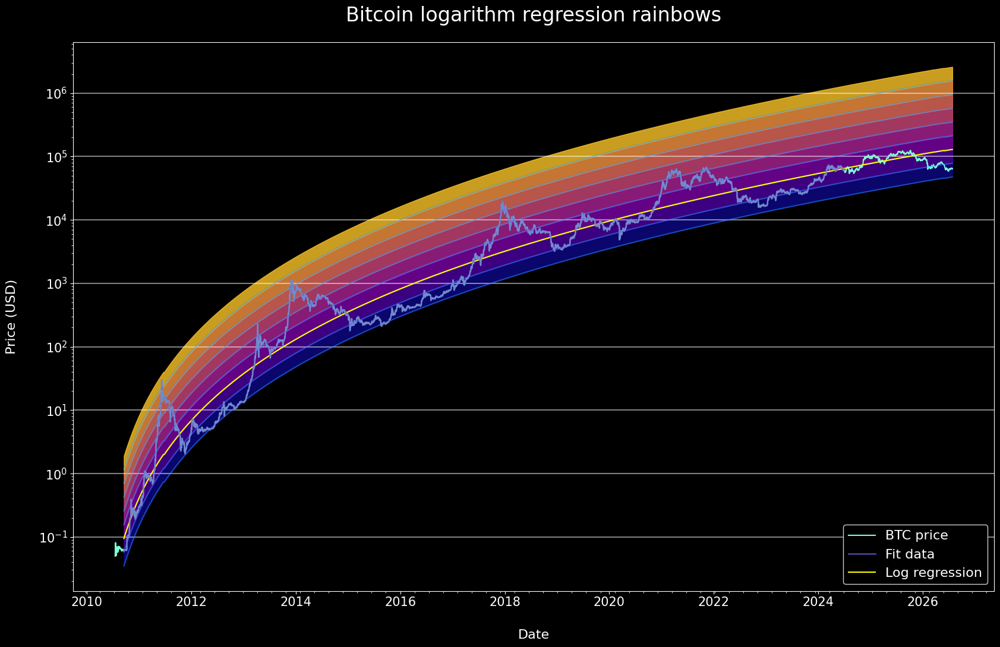

In [4]:
##### btc rainbow

def plot_log_regression_rainbow_btc(data_raw):
    data = data_raw.copy(deep=True)
    
    # fair value
    fitcut = (60, -2*365)
    cutdata = data.iloc[fitcut[0]:fitcut[1]]
    plotcutdata = data.iloc[fitcut[0]:]
    
    # fitting the regression
    
    def fit_func(x, p1, p2, p3):
        return p1+p2*np.log(x)+p3*np.log(x)**2
    
    xdata = np.array([x+1 for x in cutdata.index.values])
    ydata = np.log(cutdata["close"])
    
    popt, pcov = scipy.optimize.curve_fit(fit_func, xdata, ydata)
    polyfit_1d = fit_func(plotcutdata.index.values, *popt)
    
    
    # Setting figure up

    plt.style.use('dark_background')

    fig, ax = plt.subplots(figsize=(20, 12))
    plt.yscale("log")

    plt.xlabel("Date", fontsize = 16, labelpad = 25)
    plt.ylabel("Price (USD)", fontsize = 16, labelpad = 25)
    plt.xticks(fontsize = 15)
    plt.yticks(fontsize = 15)

    ax.get_xaxis().set_minor_locator(mpl.ticker.MultipleLocator(100))
    #     ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
    ax.grid(axis = "y", which='major', color='w', linewidth=1.5, alpha = 0.5)
    # ax.grid(axis = "y", b=True, which='minor', color='w', linewidth=0.75, linestyle = "dotted", alpha = 0.5)

    #     ax.set_ylim(top = )
    # ax.set_xlim(0, 1500)

    plt.title("Bitcoin logarithm regression rainbows", fontsize = 24, pad = 25)
    line1,  = ax.plot(data["time_close"], data["close"], color = "aquamarine")
    
    
    nareas = 8
    colors = [plt.get_cmap("plasma")(i/nareas) for i in range(nareas+1)]
    
    for i, c in zip(range(-2, nareas-2), colors):
        ax.fill_between(plotcutdata["time_close"], np.exp(polyfit_1d+i/2), np.exp(polyfit_1d+i/2+1/2), color = c, alpha = 0.8)
        ax.plot(plotcutdata["time_close"], np.exp(polyfit_1d+i/2), color = "dodgerblue", alpha = 0.5)
        
    line3,  = ax.plot(plotcutdata["time_close"], np.exp(polyfit_1d), color = "yellow")
    line2,  = ax.plot(cutdata["time_close"], cutdata["close"], color = "slateblue", linewidth = 2, alpha = 0.7)
    
    plt.legend(handles = [line1, line2, line3], labels = ["BTC price", "Fit data", "Log regression"],
               loc = "lower right", fontsize = 16, framealpha = 1)
    
    

    return polyfit_1d

plot_log_regression_rainbow_btc(df)

In [8]:
def plot_log_regression_rainbow_btc(data_raw):
    data = data_raw.copy(deep=True)

    # 1. Clean date and close price columns
    data["time_close"] = pd.to_datetime(data["time_close"])
    data["close"] = pd.to_numeric(
        data["close"].astype(str).str.replace("$", "").str.replace(",", ""),
        errors="coerce",
    )
    data = (
        data.dropna(subset=["close"])
        .sort_values("time_close")
        .reset_index(drop=True)
    )

    # 2. Compute exact elapsed calendar days for regression
    start_date = data["time_close"].min()
    data["x_days"] = (data["time_close"] - start_date).dt.days + 1

    # 3. Fair value slicing
    fitcut = (60, max(61, len(data) - 2 * 365))
    cutdata = data.iloc[fitcut[0] : fitcut[1]]
    plotcutdata = data.iloc[fitcut[0] :].copy()

    # 4. Fit logarithmic regression
    def fit_func(x, p1, p2, p3):
        return p1 + p2 * np.log(x) + p3 * np.log(x) ** 2

    popt, _ = scipy.optimize.curve_fit(
        fit_func,
        cutdata["x_days"].values,
        np.log(cutdata["close"].values),
    )

    polyfit_1d = fit_func(plotcutdata["x_days"].values, *popt)
    plotcutdata["Log Regression"] = np.exp(polyfit_1d)

    # 5. Build Rainbow Bands Data
    nareas = 8
    # Plasma color palette matching previous theme dark gradient
    plasma_colors = [
        "#0d0887",
        "#46039f",
        "#7201a8",
        "#9c179e",
        "#bd3786",
        "#d8576b",
        "#ed7953",
        "#fb9f3a",
    ]

    band_charts = []
    for idx, i in enumerate(range(-2, nareas - 2)):
        band_df = plotcutdata[["time_close"]].copy()
        band_df["lower"] = np.exp(polyfit_1d + i / 2)
        band_df["upper"] = np.exp(polyfit_1d + (i + 1) / 2)

        band_chart = (
            alt.Chart(band_df)
            .mark_area(opacity=0.75, color=plasma_colors[idx])
            .encode(
                x="time_close:T",
                y="lower:Q",
                y2="upper:Q",
            )
        )
        band_charts.append(band_chart)

    # 6. Master Legend Scale (Standardized Palette)
    legend_domain = ["BTC Price", "Fit Data Segment", "Log Regression"]
    legend_range = ["#7FFFD4", "#6A5ACD", "#FFFF00"]

    color_scale = alt.Color(
        "legend:N",
        scale=alt.Scale(domain=legend_domain, range=legend_range),
        legend=alt.Legend(
            title="Model Traces",
            orient="bottom-right",
            fillColor="#0e1117",
            strokeColor="#333333",
            padding=10,
            cornerRadius=5,
            labelColor="#cccccc",
            titleColor="#ffffff",
        ),
    )

    # 7. Chart Traces
    base_price = (
        alt.Chart(data[["time_close", "close"]])
        .mark_line(strokeWidth=1.5)
        .encode(
            x=alt.X(
                "time_close:T",
                title="Date",
                axis=alt.Axis(gridColor="#222222", labelColor="#cccccc"),
            ),
            y=alt.Y(
                "close:Q",
                scale=alt.Scale(type="log"),
                title="Price (USD)",
                axis=alt.Axis(gridColor="#222222", labelColor="#cccccc"),
            ),
            color=color_scale,
            tooltip=[
                alt.Tooltip("time_close:T", title="Date"),
                alt.Tooltip("close:Q", format="$,.2f", title="Price"),
            ],
        )
        .transform_calculate(legend="'BTC Price'")
    )

    fit_segment = (
        alt.Chart(cutdata[["time_close", "close"]])
        .mark_line(strokeWidth=2.5)
        .encode(
            x="time_close:T",
            y="close:Q",
            color=color_scale,
            tooltip=[
                alt.Tooltip("time_close:T", title="Date"),
                alt.Tooltip("close:Q", format="$,.2f", title="Fit Segment"),
            ],
        )
        .transform_calculate(legend="'Fit Data Segment'")
    )

    log_reg_line = (
        alt.Chart(plotcutdata[["time_close", "Log Regression"]])
        .mark_line(strokeWidth=2)
        .encode(
            x="time_close:T",
            y="Log Regression:Q",
            color=color_scale,
            tooltip=[
                alt.Tooltip("time_close:T", title="Date"),
                alt.Tooltip(
                    "Log Regression:Q",
                    format="$,.2f",
                    title="Fair Value Reg",
                ),
            ],
        )
        .transform_calculate(legend="'Log Regression'")
    )

    # 8. Layer Bands & Lines with Master Layout
    chart = (
        alt.layer(
            *band_charts,
            base_price,
            fit_segment,
            log_reg_line,
        )
        .properties(
            height=700,
            title=alt.TitleParams(
                text="Bitcoin Logarithm Regression Rainbows",
                color="white",
                fontSize=20,
            ),
            background="#0e1117",
        )
        .configure_view(strokeWidth=0)
        .interactive()
    )

    return chart

plot_log_regression_rainbow_btc(df)

alt.LayerChart(...)

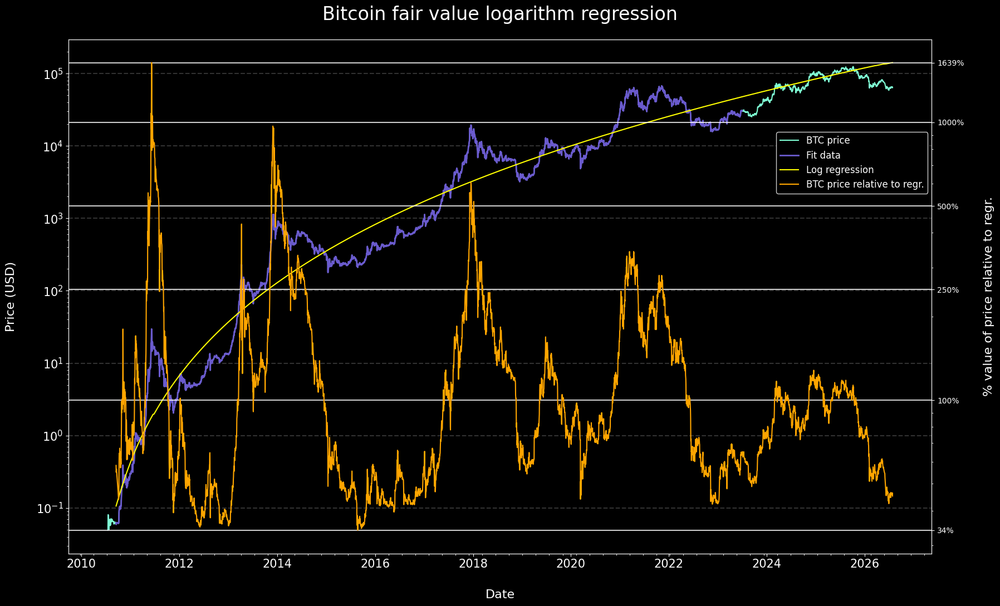

In [10]:
# log regression difference

def plot_log_regression_btc_diff(data_raw):
    data = data_raw.copy(deep=True)
#     data = data.iloc[60:360]
    
    # fitting the regression
    
    fitcut = (60, -3*365)
    
    def fit_func(x, p1, p2, p3):
        return p1+p2*np.log(x)+p3*np.log(x)**2
    
    cutdata = data.iloc[fitcut[0]:fitcut[1]]
    plotcutdata = data.iloc[fitcut[0]:]
    xdata = np.array([x+1 for x in cutdata.index.values])
    ydata = np.log(cutdata["close"])
    
    popt, pcov = scipy.optimize.curve_fit(fit_func, xdata, ydata)
    polyfit_1d = fit_func(plotcutdata.index.values+1, *popt)
    
    # Setting figure up

    plt.style.use('dark_background')

    fig, ax = plt.subplots(figsize=(20, 12))
    plt.yscale("log")

    plt.xlabel("Date", fontsize = 16, labelpad = 25)
    plt.ylabel("Price (USD)", fontsize = 16, labelpad = 25)
    plt.xticks(fontsize = 15)
    plt.yticks(fontsize = 15)

    ax.get_xaxis().set_minor_locator(mpl.ticker.MultipleLocator(100))
    #     ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
    ax.grid(axis = "y", which='major', color='w', linewidth=1.5, alpha = 0.2, linestyle = "--")
    # ax.grid(axis = "y", b=True, which='minor', color='w', linewidth=0.75, linestyle = "dotted", alpha = 0.5)

    #     ax.set_ylim(top = )
    # ax.set_xlim(0, 1500)

    plt.title("Bitcoin fair value logarithm regression", fontsize = 24, pad = 25)
    line1,  = ax.plot(data["time_close"], data["close"], color = "aquamarine")
    line2,  = ax.plot(cutdata["time_close"], cutdata["close"], color = "slateblue", linewidth = 2)
    line3,  = ax.plot(plotcutdata["time_close"], np.exp(polyfit_1d), color = "yellow")
    
    
    ax2 = ax.twinx()
    ax2.set_yscale("log")
#     ax2.grid(axis = "y", b=True, which='major', color='red', linewidth=1.5, alpha = 0.8)
    # ax2.yscale("linear")
    diff = plotcutdata["close"]/np.exp(polyfit_1d)
    line4,  = ax2.plot(plotcutdata["time_close"], diff, color = "orange")
    ax2.grid(axis = "y", which='major', color='w', linewidth=1.5, alpha = 0.8)
    
    
    plt.legend(handles = [line1, line2, line3, line4], labels = ["BTC price","Fit data", "Log regression", "BTC price relative to regr."],
               loc = (0.82, 0.7), fontsize = 12, framealpha = 1)
    
    ticks = [diff.min(), 1, 2.5, 5, 10, diff.max()]
    ax2.get_xaxis().set_minor_locator(mpl.ticker.MultipleLocator(100))
    ax2.set_yticks(ticks)
    ax2.set_yticklabels([f"{i*100:.0f}%" for i in ticks])
    ax2.set_ylabel("% value of price relative to regr.", fontsize = 16, labelpad = 25)

    return diff

plot = plot_log_regression_btc_diff(df)

In [13]:
def plot_log_regression_btc_diff(data_raw):
    data = data_raw.copy(deep=True)

    # Clean data
    data["time_close"] = pd.to_datetime(data["time_close"])
    data["close"] = pd.to_numeric(
        data["close"].astype(str).str.replace("$", "").str.replace(",", ""),
        errors="coerce",
    )
    data = (
        data.dropna(subset=["close"])
        .sort_values("time_close")
        .reset_index(drop=True)
    )

    start_date = data["time_close"].min()
    data["x_days"] = (data["time_close"] - start_date).dt.days + 1

    fitcut = (60, max(61, len(data) - 3 * 365))
    cutdata = data.iloc[fitcut[0] : fitcut[1]]
    plotcutdata = data.iloc[fitcut[0] :].copy()

    def fit_func(x, p1, p2, p3):
        return p1 + p2 * np.log(x) + p3 * np.log(x) ** 2

    popt, _ = scipy.optimize.curve_fit(
        fit_func,
        cutdata["x_days"].values,
        np.log(cutdata["close"].values),
    )

    polyfit_1d = fit_func(plotcutdata["x_days"].values, *popt)
    plotcutdata["Log Regression"] = np.exp(polyfit_1d)

    plotcutdata["diff_ratio"] = (
        plotcutdata["close"] / plotcutdata["Log Regression"]
    )
    plotcutdata["diff_pct"] = plotcutdata["diff_ratio"] * 100

    legend_domain = [
        "BTC Price",
        "Fit Data Segment",
        "Log Regression",
        "Relative Ratio",
    ]
    legend_range = ["#7FFFD4", "#6A5ACD", "#FFFF00", "#FFA500"]

    color_scale = alt.Color(
        "legend:N",
        scale=alt.Scale(domain=legend_domain, range=legend_range),
        legend=alt.Legend(
            title="Model Traces",
            orient="top-left",
            fillColor="#0e1117",
            strokeColor="#333333",
            padding=8,
            cornerRadius=5,
            labelColor="#cccccc",
            titleColor="#ffffff",
        ),
    )

    # 1. Top Chart
    base_price = (
        alt.Chart(data[["time_close", "close"]])
        .mark_line(strokeWidth=1.5)
        .encode(
            x=alt.X(
                "time_close:T",
                title=None,
                axis=alt.Axis(
                    gridColor="#222222", labelColor="#cccccc", labels=False
                ),
            ),
            y=alt.Y(
                "close:Q",
                scale=alt.Scale(type="log"),
                title="Price (USD)",
                axis=alt.Axis(gridColor="#222222", labelColor="#cccccc"),
            ),
            color=color_scale,
            tooltip=[
                alt.Tooltip("time_close:T", title="Date"),
                alt.Tooltip("close:Q", format="$,.2f", title="Price"),
            ],
        )
        .transform_calculate(legend="'BTC Price'")
    )

    fit_segment = (
        alt.Chart(cutdata[["time_close", "close"]])
        .mark_line(strokeWidth=2.5)
        .encode(
            x="time_close:T",
            y="close:Q",
            color=color_scale,
            tooltip=[
                alt.Tooltip("time_close:T", title="Date"),
                alt.Tooltip("close:Q", format="$,.2f", title="Fit Segment"),
            ],
        )
        .transform_calculate(legend="'Fit Data Segment'")
    )

    log_reg_line = (
        alt.Chart(plotcutdata[["time_close", "Log Regression"]])
        .mark_line(strokeWidth=2)
        .encode(
            x="time_close:T",
            y="Log Regression:Q",
            color=color_scale,
            tooltip=[
                alt.Tooltip("time_close:T", title="Date"),
                alt.Tooltip(
                    "Log Regression:Q",
                    format="$,.2f",
                    title="Fair Value Reg",
                ),
            ],
        )
        .transform_calculate(legend="'Log Regression'")
    )

    top_chart = alt.layer(base_price, fit_segment, log_reg_line).properties(
        width=900, height=380
    )

    # 2. Bottom Chart
    ratio_line = (
        alt.Chart(plotcutdata[["time_close", "diff_ratio", "diff_pct"]])
        .mark_line(strokeWidth=1.5)
        .encode(
            x=alt.X(
                "time_close:T",
                title="Date",
                axis=alt.Axis(gridColor="#222222", labelColor="#cccccc"),
            ),
            y=alt.Y(
                "diff_ratio:Q",
                scale=alt.Scale(type="log"),
                title="Ratio to Regr.",
                axis=alt.Axis(gridColor="#222222", labelColor="#cccccc"),
            ),
            color=color_scale,
            tooltip=[
                alt.Tooltip("time_close:T", title="Date"),
                alt.Tooltip(
                    "diff_ratio:Q", format=".2f", title="Ratio Multiplier"
                ),
                alt.Tooltip("diff_pct:Q", format=".0f", title="% of Regr."),
            ],
        )
        .transform_calculate(legend="'Relative Ratio'")
    )

    baseline = (
        alt.Chart(pd.DataFrame({"y": [1.0]}))
        .mark_rule(color="#ffffff", strokeDash=[4, 4], opacity=0.5)
        .encode(y="y:Q")
    )

    bottom_chart = alt.layer(baseline, ratio_line).properties(
        width=900, height=180
    )

    # 3. Concatenate
    combined_chart = (
        alt.vconcat(top_chart, bottom_chart)
        .resolve_scale(x="shared")
        .properties(
            title=alt.TitleParams(
                text="Bitcoin Fair Value Logarithm Regression & Difference Ratio",
                color="white",
                fontSize=18,
                anchor="start",
            ),
            background="#0e1117",
            bounds="full",
        )
        .configure_view(strokeWidth=0)
    )

    return combined_chart

plot_log_regression_btc_diff(df)

alt.VConcatChart(...)

In [14]:
# yearly returns

def n_year_returns_altair(data_raw, n):
    data = data_raw.copy(deep=True)

    # Clean data
    data["time_close"] = pd.to_datetime(data["time_close"])
    data["close"] = pd.to_numeric(
        data["close"].astype(str).str.replace("$", "").str.replace(",", ""),
        errors="coerce",
    )
    data = (
        data.dropna(subset=["close"])
        .sort_values("time_close")
        .reset_index(drop=True)
    )

    # Calculate n-year log10 returns: log10(1 + pct_change)
    data["returns"] = np.log10(1 + data["close"].pct_change(int(365 * n)))

    # Master legend scale
    legend_domain = ["BTC Price", f"{n}-Year Return (log10)"]
    legend_range = ["#7FFFD4", "#0000FF"]  # Aquamarine & Blue

    color_scale = alt.Color(
        "legend:N",
        scale=alt.Scale(domain=legend_domain, range=legend_range),
        legend=alt.Legend(
            title="Model Traces",
            orient="top-left",
            fillColor="#0e1117",
            strokeColor="#333333",
            padding=8,
            cornerRadius=5,
            labelColor="#cccccc",
            titleColor="#ffffff",
        ),
    )

    # 1. Top Chart - BTC Price (Log Scale)
    top_chart = (
        alt.Chart(data[["time_close", "close"]])
        .mark_line(strokeWidth=1.5)
        .encode(
            x=alt.X(
                "time_close:T",
                title=None,
                axis=alt.Axis(
                    gridColor="#222222", labelColor="#cccccc", labels=False
                ),
            ),
            y=alt.Y(
                "close:Q",
                scale=alt.Scale(type="log"),
                title="Price (USD)",
                axis=alt.Axis(gridColor="#222222", labelColor="#cccccc"),
            ),
            color=color_scale,
            tooltip=[
                alt.Tooltip("time_close:T", title="Date"),
                alt.Tooltip("close:Q", format="$,.2f", title="Price"),
            ],
        )
        .transform_calculate(legend="'BTC Price'")
        .properties(width=900, height=380)
    )

    # 2. Bottom Chart - Returns
    bottom_chart = (
        alt.Chart(data.dropna(subset=["returns"])[["time_close", "returns"]])
        .mark_line(strokeWidth=1.5)
        .encode(
            x=alt.X(
                "time_close:T",
                title="Date",
                axis=alt.Axis(gridColor="#222222", labelColor="#cccccc"),
            ),
            y=alt.Y(
                "returns:Q",
                title=f"{n}-Yr Log10 Return",
                axis=alt.Axis(gridColor="#442222", labelColor="#cccccc"),
            ),
            color=color_scale,
            tooltip=[
                alt.Tooltip("time_close:T", title="Date"),
                alt.Tooltip(
                    "returns:Q", format=".3f", title=f"{n}-Yr Log Return"
                ),
            ],
        )
        .transform_calculate(legend=f"'{n}-Year Return (log10)'")
        .properties(width=900, height=180)
    )

    # 3. Concatenate vertically
    combined_chart = (
        alt.vconcat(top_chart, bottom_chart)
        .resolve_scale(x="shared")
        .properties(
            title=alt.TitleParams(
                text=f"Bitcoin {n}-Year Log10 Returns",
                color="white",
                fontSize=18,
                anchor="start",
            ),
            background="#0e1117",
            bounds="full",
        )
        .configure_view(strokeWidth=0)
    )

    return combined_chart

n_year_returns_altair(df, 1)

alt.VConcatChart(...)

In [26]:
# returns ditribution

def plot_returns_distribution(df_raw):
    data = df_raw.copy()

    # Clean price column and calculate 1-day percent returns
    data["close"] = pd.to_numeric(
        data["close"].astype(str).str.replace("$", "").str.replace(",", ""),
        errors="coerce",
    )
    data["returns"] = data["close"].pct_change(1)
    data = data.dropna(subset=["returns"])

    # Build Histogram Chart
    chart = (
        alt.Chart(data)
        .mark_bar(color="#7FFFD4", opacity=0.85)
        .encode(
            x=alt.X(
                "returns:Q",
                bin=alt.Bin(maxbins=50),
                title="Daily Return",
                axis=alt.Axis(
                    format="%", gridColor="#222222", labelColor="#cccccc"
                ),
            ),
            y=alt.Y(
                "count()",
                title="Frequency (Days)",
                axis=alt.Axis(gridColor="#222222", labelColor="#cccccc"),
            ),
            tooltip=[
                alt.Tooltip(
                    "returns:Q",
                    bin=True,
                    format=".2%",
                    title="Return Bin Range",
                ),
                alt.Tooltip("count()", title="Days Count"),
            ],
        )
        .properties(
            width=900,
            height=450,
            title=alt.TitleParams(
                text="Bitcoin Daily Returns Distribution",
                color="white",
                fontSize=18,
                anchor="start",
            ),
            background="#0e1117",
            bounds="full",
        )
        .configure_view(strokeWidth=0)
    )

    return chart

plot_returns_distribution(df)

alt.Chart(...)

In [25]:
def fit_best_return_distribution(df_raw):
    data = df_raw.copy()
    
    # 1. Prepare Returns Data
    data["close"] = pd.to_numeric(data["close"].astype(str).str.replace("$", "").str.replace(",", ""), errors='coerce')
    returns = data["close"].pct_change(1).dropna().values
    
    # 2. Candidate Distributions to Evaluate
    candidate_distributions = {
        "Student-t": stats.t,
        "Laplace": stats.laplace,
        "Skew-Normal": stats.skewnorm,
        "Normal": stats.norm,
    }
    
    fit_results = []
    pdf_curves = []
    x_eval = np.linspace(returns.min(), returns.max(), 500)
    
    # 3. Fit and Rank Distributions
    for name, dist in candidate_distributions.items():
        # Maximum Likelihood Estimation (MLE)
        params = dist.fit(returns)
        
        # Goodness-of-fit Evaluation via Kolmogorov-Smirnov Test
        ks_stat, p_value = stats.kstest(returns, dist.name, args=params)
        
        fit_results.append({
            "distribution": name,
            "ks_stat": ks_stat,
            "p_value": p_value,
            "params": params
        })
        
        # Calculate theoretical PDF values across the x-axis domain
        pdf_y = dist.pdf(x_eval, *params)
        for x_val, y_val in zip(x_eval, pdf_y):
            pdf_curves.append({
                "returns": x_val,
                "density": y_val,
                "model": name
            })

    results_df = pd.DataFrame(fit_results).sort_values("ks_stat").reset_index(drop=True)
    best_dist_name = results_df.iloc[0]["distribution"]
    pdf_df = pd.DataFrame(pdf_curves)
    
    # 4. Build Altair Plot
    # Base Histogram (Normalized to Density)
    histogram = alt.Chart(pd.DataFrame({"returns": returns})).mark_bar(
        color="#333333", opacity=0.6).encode(
        x=alt.X("returns:Q", bin=alt.Bin(maxbins=60), title="Daily Return", axis=alt.Axis(format="%", gridColor="#222222", labelColor="#cccccc")),
        y=alt.Y("density:Q", title="Density", axis=alt.Axis(gridColor="#222222", labelColor="#cccccc")),
    ).transform_calculate(
        # Convert frequency count into probability density to match PDF curves
        density="datum.count / (datum.datum * 1.0)" 
    )

    # Fitted Distribution Curves Overlay
    density_curves = alt.Chart(pdf_df).mark_line(strokeWidth=2).encode(
        x="returns:Q",
        y="density:Q",
        color=alt.Color("model:N", scale=alt.Scale(
            domain=["Student-t", "Laplace", "Skew-Normal", "Normal"],
            range=["#7FFFD4", "#FFA500", "#FF007F", "#888888"]
        ), legend=alt.Legend(title="Fitted Model")),
        strokeDash=alt.condition(
            alt.datum.model == best_dist_name,
            alt.value([0]),      # Solid line for the winning best fit
            alt.value([4, 4])    # Dashed lines for other fits
        )
    )

    chart = (histogram + density_curves).properties(
        width=900,
        height=450,
        title=alt.TitleParams(
            text=f"Return Distribution Fit (Best: {best_dist_name})",
            subtitle=f"Ranked by Kolmogorov-Smirnov Statistic (Lower = Better Fit)",
            color="white",
            subtitleColor="#aaaaaa",
            fontSize=18,
            anchor="start"
        ),
        background="#0e1117",
    ).configure_view(strokeWidth=0)

    return chart, results_df

chart, results = fit_best_return_distribution(df)
chart

alt.LayerChart(...)

In [38]:
def plot_returns_t_distribution(df_raw):
    data = df_raw.copy()

    # 1. Clean data and compute daily percent returns
    data["close"] = pd.to_numeric(
        data["close"].astype(str).str.replace("$", "").str.replace(",", ""),
        errors="coerce",
    )
    returns = data["close"].pct_change(1).dropna().values

    # 2. Fit Student's t-distribution
    df_param, loc_param, scale_param = stats.t.fit(returns)

    # 3. Generate fitted PDF points
    x_eval = np.linspace(returns.min(), returns.max(), 500)
    pdf_eval = stats.t.pdf(x_eval, df_param, loc_param, scale_param)
    pdf_df = pd.DataFrame({"returns": x_eval, "density": pdf_eval})

    returns_df = pd.DataFrame({"returns": returns})

    # 4. Master Legend Color Scale
    color_scale = alt.Color(
        "legend:N",
        scale=alt.Scale(
            domain=["Daily Returns", "Fitted Student-t"],
            range=["#7FFFD4", "#3F51B5"],  # Aquamarine bars & Gold curve
        ),
        legend=alt.Legend(
            title="Model Traces",
            orient="top-right",
            fillColor="#0e1117",
            strokeColor="#333333",
            padding=8,
            cornerRadius=5,
            labelColor="#cccccc",
            titleColor="#ffffff",
        ),
    )

    # 5. Frequency Histogram (Aquamarine bars matching screenshot)
    histogram = (
        alt.Chart(returns_df)
        .mark_bar(opacity=0.85)
        .encode(
            x=alt.X(
                "returns:Q",
                bin=alt.Bin(maxbins=50),
                title="Daily Return",
                axis=alt.Axis(
                    format="%", gridColor="#222222", labelColor="#cccccc"
                ),
            ),
            y=alt.Y(
                "count()",
                title="Frequency (Days)",
                axis=alt.Axis(gridColor="#222222", labelColor="#cccccc"),
            ),
            color=color_scale,
            tooltip=[
                alt.Tooltip(
                    "returns:Q",
                    bin=True,
                    format=".2%",
                    title="Return Bin Range",
                ),
                alt.Tooltip("count()", title="Days Count"),
            ],
        )
        .transform_calculate(legend="'Daily Returns'")
    )

    # 6. Fitted Student's t PDF Curve (Independent Y-Scale)
    t_curve = (
        alt.Chart(pdf_df)
        .mark_line(strokeWidth=2.5)
        .encode(
            x="returns:Q",
            y=alt.Y("density:Q", axis=None),  # Hide secondary Y axis labels
            color=color_scale,
            tooltip=[
                alt.Tooltip("returns:Q", format=".2%", title="Return"),
                alt.Tooltip("density:Q", format=".2f", title="Model Density"),
            ],
        )
        .transform_calculate(legend="'Fitted Student-t'")
    )

    # 7. Layer and Resolve Independent Y-Axes
    chart = (
        alt.layer(histogram, t_curve)
        .resolve_scale(y="independent")
        .properties(
            width=900,
            height=480,
            title=alt.TitleParams(
                text="Bitcoin Daily Returns Distribution",
                subtitle=f"Fitted Student's t (ν={df_param:.2f}, loc={loc_param:.4f}, scale={scale_param:.4f})",
                color="white",
                subtitleColor="#aaaaaa",
                fontSize=18,
                anchor="start",
            ),
            background="#0e1117",
        )
        .configure_view(strokeWidth=0)
    )

    return chart
    
plot_returns_t_distribution(df)

alt.LayerChart(...)

In [48]:

def plot_btc_30d_volatility(df_raw, period = 30):
    data = df_raw.copy()

    # 1. Clean price data and sort
    data["time_close"] = pd.to_datetime(data["time_close"])
    data["close"] = pd.to_numeric(
        data["close"].astype(str).str.replace("$", "").str.replace(",", ""),
        errors="coerce",
    )
    data = (
        data.dropna(subset=["close"])
        .sort_values("time_close")
        .reset_index(drop=True)
    )

    # 2. Calculate 30-Day Annualized Volatility
    data["daily_return"] = data["close"].pct_change(1)
    # 30-day rolling std dev scaled to 365 trading days
    data["volatility_30d"] = (
        data["daily_return"].rolling(window=period).std() * np.sqrt(365) * 100
    )

    # 3. Master Legend Scale
    legend_domain = ["BTC Price", f"{period}D Volatility (Annualized)"]
    legend_range = ["#7FFFD4", "#FF7F50"]  # Aquamarine & Coral/Orange

    color_scale = alt.Color(
        "legend:N",
        scale=alt.Scale(domain=legend_domain, range=legend_range),
        legend=alt.Legend(
            title="Model Traces",
            orient="top-left",
            fillColor="#0e1117",
            strokeColor="#333333",
            padding=8,
            cornerRadius=5,
            labelColor="#cccccc",
            titleColor="#ffffff",
        ),
    )

    # 4. Top Chart - BTC Price (Log Scale)
    top_chart = (
        alt.Chart(data[["time_close", "close"]])
        .mark_line(strokeWidth=1.5)
        .encode(
            x=alt.X(
                "time_close:T",
                title=None,
                axis=alt.Axis(
                    gridColor="#222222", labelColor="#cccccc", labels=False
                ),
            ),
            y=alt.Y(
                "close:Q",
                scale=alt.Scale(type="log"),
                title="Price (USD)",
                axis=alt.Axis(gridColor="#222222", labelColor="#cccccc"),
            ),
            color=color_scale,
            tooltip=[
                alt.Tooltip("time_close:T", title="Date"),
                alt.Tooltip("close:Q", format="$,.2f", title="Price"),
            ],
        )
        .transform_calculate(legend="'BTC Price'")
        .properties(width=900, height=380)
    )

    # 5. Bottom Chart - 30-Day Rolling Volatility
    bottom_chart = (
        alt.Chart(
            data.dropna(subset=["volatility_30d"])[
                ["time_close", "volatility_30d"]
            ]
        )
        .mark_line(strokeWidth=1.5)
        .encode(
            x=alt.X(
                "time_close:T",
                title="Date",
                axis=alt.Axis(gridColor="#222222", labelColor="#cccccc"),
            ),
            y=alt.Y(
                "volatility_30d:Q",
                title="30D Volatility (%)",
                axis=alt.Axis(
                    gridColor="#222222", labelColor="#cccccc", format=".0f"
                ),
            ),
            color=color_scale,
            tooltip=[
                alt.Tooltip("time_close:T", title="Date"),
                alt.Tooltip(
                    "volatility_30d:Q", format=".2f", title="30D Volatility (%)"
                ),
            ],
        )
        .transform_calculate(legend="'30D Volatility (Annualized)'")
        .properties(width=900, height=180)
    )

    # 6. Stack vertically
    combined_chart = (
        alt.vconcat(top_chart, bottom_chart)
        .resolve_scale(x="shared")
        .properties(
            title=alt.TitleParams(
                text="Bitcoin Price & 30-Day Annualized Volatility",
                color="white",
                fontSize=18,
                anchor="start",
            ),
            background="#0e1117",
            bounds="full",
        )
        .configure_view(strokeWidth=0)
    )

    return combined_chart


plot_btc_30d_volatility(df)

alt.VConcatChart(...)

In [16]:
def plot_btc_volatility_bands(
    df_raw, vol_window=30, sma_window=20, num_std=3
):
    data = df_raw.copy().reset_index()

    # 1. Flexible date column detection and parsing
    date_col = next(
        (
            col
            for col in ["time_close", "Date", "date", "timestamp", "index"]
            if col in data.columns
        ),
        data.columns[0],
    )
    data["clean_date"] = pd.to_datetime(data[date_col])

    # 2. Flexible price column detection and cleaning
    price_col = next(
        (
            col
            for col in ["close", "Close", "price", "Price"]
            if col in data.columns
        ),
        None,
    )
    if not price_col:
        raise ValueError("No price/close column found in dataframe.")

    data["clean_price"] = pd.to_numeric(
        data[price_col].astype(str).str.replace("$", "").str.replace(",", ""),
        errors="coerce",
    )

    # Clean & Sort
    clean_df = (
        data.dropna(subset=["clean_date", "clean_price"])
        .sort_values("clean_date")
        .reset_index(drop=True)
    )

    # 3. Indicator Calculations
    clean_df["daily_return"] = clean_df["clean_price"].pct_change(1)
    clean_df["daily_std_30d"] = (
        clean_df["daily_return"].rolling(window=vol_window).std()
    )

    clean_df["price_sma"] = (
        clean_df["clean_price"].rolling(window=sma_window).mean()
    )
    clean_df["upper_band"] = clean_df["price_sma"] * (
        1 + (num_std * clean_df["daily_std_30d"])
    )
    clean_df["lower_band"] = clean_df["price_sma"] * (
        1 - (num_std * clean_df["daily_std_30d"])
    )

    plot_data = clean_df.dropna(subset=["upper_band"]).copy()

    # 4. Color Scale Legend Definition
    legend_domain = [
        "BTC Price",
        f"{sma_window}D Price SMA",
        f"±{num_std} Std Dev Bands",
    ]
    legend_range = ["#7FFFD4", "#1E90FF", "#888888"]

    color_scale = alt.Color(
        "legend:N",
        scale=alt.Scale(domain=legend_domain, range=legend_range),
        legend=alt.Legend(
            title="Model Traces",
            orient="top-left",
            fillColor="#0e1117",
            strokeColor="#333333",
            padding=8,
            cornerRadius=5,
            labelColor="#cccccc",
            titleColor="#ffffff",
        ),
    )

    # --- PRICE & BANDS LAYERS ---
    # Shaded Band Area
    band_area = (
        alt.Chart(plot_data)
        .mark_area(opacity=0.15, color="#888888")
        .encode(
            x="clean_date:T",
            y="lower_band:Q",
            y2="upper_band:Q",
        )
    )

    # Band Boundary Lines
    band_lines = (
        alt.Chart(
            plot_data.melt(
                id_vars=["clean_date"],
                value_vars=["upper_band", "lower_band"],
                var_name="band_type",
                value_name="band_val",
            )
        )
        .mark_line(strokeDash=[4, 4], strokeWidth=1)
        .encode(
            x="clean_date:T",
            y=alt.Y("band_val:Q", scale=alt.Scale(type="log")),
            color=color_scale,
            tooltip=[
                alt.Tooltip("clean_date:T", title="Date"),
                alt.Tooltip(
                    "band_val:Q", format="$,.2f", title="Band Value"
                ),
            ],
        )
        .transform_calculate(legend=f"'±{num_std} Std Dev Bands'")
    )

    # Price SMA
    sma_line = (
        alt.Chart(plot_data)
        .mark_line(strokeWidth=1.5)
        .encode(
            x="clean_date:T",
            y="price_sma:Q",
            color=color_scale,
            tooltip=[
                alt.Tooltip("clean_date:T", title="Date"),
                alt.Tooltip("price_sma:Q", format="$,.2f", title="SMA"),
            ],
        )
        .transform_calculate(legend=f"'{sma_window}D Price SMA'")
    )

    # BTC Price Line
    price_line = (
        alt.Chart(plot_data)
        .mark_line(strokeWidth=1.5)
        .encode(
            x=alt.X(
                "clean_date:T",
                title="Date",
                axis=alt.Axis(gridColor="#222222", labelColor="#cccccc"),
            ),
            y=alt.Y(
                "clean_price:Q",
                scale=alt.Scale(type="log"),
                title="Price (USD)",
                axis=alt.Axis(gridColor="#222222", labelColor="#cccccc"),
            ),
            color=color_scale,
            tooltip=[
                alt.Tooltip("clean_date:T", title="Date"),
                alt.Tooltip("clean_price:Q", format="$,.2f", title="Price"),
            ],
        )
        .transform_calculate(legend="'BTC Price'")
    )

    # Combine into a single interactive chart
    chart = (
        alt.layer(band_area, band_lines, sma_line, price_line)
        .properties(
            width=900,
            height=500,
            title=alt.TitleParams(
                text="Bitcoin Price with 30-Day Volatility Bands Indicator",
                subtitle=f"Bands: {sma_window}-Day SMA ± {num_std} Standard Deviations of Volatility",
                color="white",
                subtitleColor="#aaaaaa",
                fontSize=18,
                anchor="start",
            ),
            background="#0e1117",
        )
        .configure_view(strokeWidth=0)
        .interactive()
    )

    return chart

plot_btc_volatility_bands(df)

alt.LayerChart(...)

In [20]:
#rvi
def calculate_rvi(df: pd.DataFrame, std_period: int = 10, smooth_period: int = 14) -> pd.Series:
    """
    Calculates Donald Dorsey's Relative Volatility Index (RVI).
    
    Parameters:
    - df: DataFrame with 'close', 'high', and 'low' columns.
    - std_period: Rolling window for standard deviation (default: 10).
    - smooth_period: Exponential smoothing window (Wilder's RSI-style, default: 14).
    """
    # 1. Calculate standard deviation of Highs and Lows over std_period
    std_high = df['high'].rolling(window=std_period).std(ddof=0)
    std_low = df['low'].rolling(window=std_period).std(ddof=0)
    
    # Average the standard deviation of high and low
    std_avg = (std_high + std_low) / 2.0
    
    # 2. Determine price direction relative to previous close
    change = df['close'].diff()
    
    # Separate directional volatility
    u_vol = np.where(change > 0, std_avg, 0.0)
    d_vol = np.where(change < 0, std_avg, 0.0)
    
    # 3. Apply Exponential Moving Average (Wilder's Smoothing)
    # alpha = 1 / smooth_period matches Wilder's EMA standard for RSI/RVI
    u_ema = pd.Series(u_vol, index=df.index).ewm(alpha=1/smooth_period, adjust=False).mean()
    d_ema = pd.Series(d_vol, index=df.index).ewm(alpha=1/smooth_period, adjust=False).mean()
    
    # 4. Calculate RVI bounded between 0 and 100
    rvi = 100 * (u_ema / (u_ema + d_ema))
    
    return rvi

df["rvi"] = calculate_rvi(df)
df

,time_close,close,high,low,rvi
0,2010-07-17 00:00:00+00:00,0.04951,0.04951,0.04951,NaN
1,2010-07-19 00:00:00+00:00,0.08080,0.09307,0.07723,NaN
2,2010-07-20 00:00:00+00:00,0.07474,0.07474,0.07426,NaN
3,2010-07-21 00:00:00+00:00,0.07921,0.07921,0.07171,NaN
4,2010-07-22 00:00:00+00:00,0.05248,0.05941,0.05050,NaN
...,...,...,...,...,...
5816,2026-07-20 00:00:00+00:00,65255.51000,65799.00000,63100.00000,52.160332
5817,2026-07-24 00:00:00+00:00,64139.99000,65808.59000,63739.75000,50.111069
5818,2026-07-25 00:00:00+00:00,64375.00000,64475.28000,63810.00000,52.139964
5819,2026-07-26 00:00:00+00:00,65399.99000,65577.00000,64293.81000,53.920888


In [22]:
def plot_rvi(df_raw, std_period=10, smooth_period=14):
    data = df_raw.copy().reset_index()

    # Detect Date Column
    date_col = next(
        (
            col
            for col in ["time_close", "Date", "date", "timestamp", "index"]
            if col in data.columns
        ),
        data.columns[0],
    )
    data["clean_date"] = pd.to_datetime(data[date_col])

    # Calculate RVI
    data["rvi"] = calculate_rvi(
        data, std_period=std_period, smooth_period=smooth_period
    )
    plot_data = data.dropna(subset=["clean_date", "rvi"]).copy()

    # Reference Threshold DataFrames
    rect_data = pd.DataFrame(
        [
            {"y1": 80, "y2": 100, "zone": "Overbought / Bullish Volatility"},
            {"y1": 0, "y2": 20, "zone": "Oversold / Bearish Volatility"},
        ]
    )

    lines_data = pd.DataFrame(
        [
            {"val": 50, "type": "Neutral (50)"},
            {"val": 80, "type": "Upper Band (80)"},
            {"val": 20, "type": "Lower Band (20)"},
        ]
    )

    # --- ALTAIR LAYERS ---
    # Shaded Extremes (0-20 and 80-100)
    shading = (
        alt.Chart(rect_data)
        .mark_rect(opacity=0.08)
        .encode(
            y="y1:Q",
            y2="y2:Q",
            color=alt.Color(
                "zone:N",
                scale=alt.Scale(
                    domain=[
                        "Overbought / Bullish Volatility",
                        "Oversold / Bearish Volatility",
                    ],
                    range=["#FF4500", "#00FF7F"],
                ),
                legend=None,
            ),
        )
    )

    # Horizontal Lines at 20, 50, 80
    reference_lines = (
        alt.Chart(lines_data)
        .mark_rule(strokeDash=[4, 4], strokeWidth=1, color="#666666")
        .encode(y="val:Q")
    )

    # Main RVI Line
    rvi_line = (
        alt.Chart(plot_data)
        .mark_line(strokeWidth=1.8, color="#8B5CF6")
        .encode(
            x=alt.X(
                "clean_date:T",
                title="Date",
                axis=alt.Axis(gridColor="#222222", labelColor="#cccccc"),
            ),
            y=alt.Y(
                "rvi:Q",
                title="RVI (0-100)",
                scale=alt.Scale(domain=[0, 100]),
                axis=alt.Axis(gridColor="#222222", labelColor="#cccccc"),
            ),
            tooltip=[
                alt.Tooltip("clean_date:T", title="Date"),
                alt.Tooltip("rvi:Q", format=".2f", title="RVI"),
            ],
        )
    )

    # Combined Chart
    chart = (
        alt.layer(shading, reference_lines, rvi_line)
        .properties(
            width=900,
            height=260,
            title=alt.TitleParams(
                text="Relative Volatility Index (RVI)",
                subtitle=f"Donald Dorsey RVI ({std_period}-Period StdDev, {smooth_period}-Period Wilder Smoothing)",
                color="white",
                subtitleColor="#aaaaaa",
                fontSize=16,
                anchor="start",
            ),
            background="#0e1117",
        )
        .configure_view(strokeWidth=0)
        .interactive()
    )

    return chart

plot_rvi(df)

alt.LayerChart(...)